# Applying SHRED to the Mice Dataset 

Dataset obtained from Allen Brain Atlas https://allensdk.readthedocs.io/en/latest/visual_coding_neuropixels.html

SHRED (SHallow REcurrent Decoder) models are a network architecture that merges a recurrent layer (LSTM) with a shallow decoder network (SDN) to reconstruct high-dimensional spatio-temporal fields from a trajectory of sensor measurements of the field. More formally, the SHRED architecture can be written as
$$ \mathcal {H} \left( \{ y_i \} _{i=t-k}^t \right) = \mathcal {F} \left( \mathcal {G} \left( \{ y_i \} _{i=t-k}^t \right) ; W_{RN}) ; W_{SD} \right)$$
where $\mathcal F$ is a feed forward network parameterized by weights $W_{SD}$, $\mathcal G$ is a LSTM network parameterized by weights $W_{RN}$, and $\{ y_i \} _{i=t-k}^t$ is a trajectory of sensor measurements of a high-dimensional spatio-temporal field $\{ x_i \} _{i=t-k}^t$.

**Loading in data to understand data format**

In [4]:
# Importing all dependencies 
import numpy as np
import numpy as np
import torch
import subprocess
import os
import torch
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
import random
import mne
from scipy.signal import butter, filtfilt
from scipy.signal import welch
from scipy.interpolate import CubicSpline
from scipy.io import loadmat
from sklearn.linear_model import Ridge



In [16]:
import xarray as xr
import pandas as pd
from scipy.ndimage import gaussian_filter
from pathlib import Path
import json
from IPython.display import display
from PIL import Image

from allensdk.brain_observatory.ecephys.visualization import plot_mean_waveforms, plot_spike_counts, raster_plot
from allensdk.brain_observatory.visualization import plot_running_speed

# tell pandas to show all columns when we display a DataFrame
pd.set_option("display.max_columns", None)

In [ ]:
#Set up data cache
from allensdk.brain_observatory.ecephys.ecephys_project_cache import EcephysProjectCache

data_directory = "/home/amy/SHRED_neuro/mice/data" #where data will be stored
manifest_path = os.path.join(data_directory, 'manifest.json')
cache = EcephysProjectCache.from_warehouse(manifest = manifest_path)

In [ ]:
sessions = cache.get_session_table()

print('Total number of sessions: ' + str(len(sessions)))

sessions.head()


#Can also filter which mice to select
filtered_sessions = sessions[(sessions.sex == 'M') & \
                             (sessions.full_genotype.str.find('Sst') > -1) & \
                             (sessions.session_type == 'brain_observatory_1.1') & \
                             (['VISl' in acronyms for acronyms in 
                               sessions.ecephys_structure_acronyms])]

filtered_sessions.head()

Total number of sessions: 58


,published_at,specimen_id,session_type,age_in_days,sex,full_genotype,unit_count,channel_count,probe_count,ecephys_structure_acronyms
id,,,,,,,,,,
715093703,2019-10-03T00:00:00Z,699733581,brain_observatory_1.1,118.0,M,Sst-IRES-Cre/wt;Ai32(RCL-ChR2(H134R)_EYFP)/wt,884,2219,6,"[CA1, VISrl, nan, PO, LP, LGd, CA3, DG, VISl, ..."
719161530,2019-10-03T00:00:00Z,703279284,brain_observatory_1.1,122.0,M,Sst-IRES-Cre/wt;Ai32(RCL-ChR2(H134R)_EYFP)/wt,755,2214,6,"[TH, Eth, APN, POL, LP, DG, CA1, VISpm, nan, N..."
721123822,2019-10-03T00:00:00Z,707296982,brain_observatory_1.1,125.0,M,Pvalb-IRES-Cre/wt;Ai32(RCL-ChR2(H134R)_EYFP)/wt,444,2229,6,"[MB, SCig, PPT, NOT, DG, CA1, VISam, nan, LP, ..."
732592105,2019-10-03T00:00:00Z,717038288,brain_observatory_1.1,100.0,M,wt/wt,824,1847,5,"[grey, VISpm, nan, VISp, VISl, VISal, VISrl]"
737581020,2019-10-03T00:00:00Z,718643567,brain_observatory_1.1,108.0,M,wt/wt,568,2218,6,"[grey, VISmma, nan, VISpm, VISp, VISl, VISrl]"


In [17]:
probes = cache.get_probes()

print('Total number of probes: ' + str(len(probes)))

probes.head()

Total number of probes: 332


,ecephys_session_id,lfp_sampling_rate,name,phase,sampling_rate,has_lfp_data,unit_count,channel_count,ecephys_structure_acronyms
id,,,,,,,,,
729445648,719161530,1249.998642,probeA,3a,29999.967418,True,87,374,"[APN, LP, MB, DG, CA1, VISam, nan]"
729445650,719161530,1249.996620,probeB,3a,29999.918880,True,202,368,"[TH, Eth, APN, POL, LP, DG, CA1, VISpm, nan]"
729445652,719161530,1249.999897,probeC,3a,29999.997521,True,207,373,"[APN, NOT, MB, DG, SUB, VISp, nan]"
729445654,719161530,1249.996707,probeD,3a,29999.920963,True,93,358,"[grey, VL, CA3, CA2, CA1, VISl, nan]"
729445656,719161530,1249.999979,probeE,3a,29999.999500,True,138,370,"[PO, VPM, TH, LP, LGd, CA3, DG, CA1, VISal, nan]"


In [18]:
channels = cache.get_channels()

print('Total number of channels: ' + str(len(channels)))

channels.head()

Total number of channels: 123224


,ecephys_probe_id,local_index,probe_horizontal_position,probe_vertical_position,anterior_posterior_ccf_coordinate,dorsal_ventral_ccf_coordinate,left_right_ccf_coordinate,ecephys_structure_id,ecephys_structure_acronym,ecephys_session_id,lfp_sampling_rate,phase,sampling_rate,has_lfp_data,unit_count
id,,,,,,,,,,,,,,,
849705558,792645504,1,11,20,8165.0,3314.0,6862.0,215.0,APN,779839471,1250.001479,3a,30000.035489,True,0
849705560,792645504,2,59,40,8162.0,3307.0,6866.0,215.0,APN,779839471,1250.001479,3a,30000.035489,True,0
849705562,792645504,3,27,40,8160.0,3301.0,6871.0,215.0,APN,779839471,1250.001479,3a,30000.035489,True,0
849705564,792645504,4,43,60,8157.0,3295.0,6875.0,215.0,APN,779839471,1250.001479,3a,30000.035489,True,0
849705566,792645504,5,11,60,8155.0,3288.0,6879.0,215.0,APN,779839471,1250.001479,3a,30000.035489,True,0


In [20]:
units = cache.get_units()

print('Total number of units: ' + str(len(units)))
units.head()

Total number of units: 40010


,waveform_PT_ratio,waveform_amplitude,amplitude_cutoff,cumulative_drift,d_prime,waveform_duration,ecephys_channel_id,firing_rate,waveform_halfwidth,isi_violations,isolation_distance,L_ratio,max_drift,nn_hit_rate,nn_miss_rate,presence_ratio,waveform_recovery_slope,waveform_repolarization_slope,silhouette_score,snr,waveform_spread,waveform_velocity_above,waveform_velocity_below,ecephys_probe_id,local_index,probe_horizontal_position,probe_vertical_position,anterior_posterior_ccf_coordinate,dorsal_ventral_ccf_coordinate,left_right_ccf_coordinate,ecephys_structure_id,ecephys_structure_acronym,ecephys_session_id,lfp_sampling_rate,name,phase,sampling_rate,has_lfp_data,date_of_acquisition,published_at,specimen_id,session_type,age_in_days,sex,genotype
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
915956282,0.611816,164.878740,0.072728,309.71,3.910873,0.535678,850229419,6.519432,0.164824,0.104910,30.546900,0.013865,27.10,0.898126,0.001599,0.99,-0.087545,0.480915,0.102369,1.911839,30.0,0.000000,NaN,733744647,3,27,40,NaN,NaN,NaN,8.0,grey,732592105,1249.996475,probeB,3a,29999.915391,True,2019-01-09T00:26:20Z,2019-10-03T00:00:00Z,717038288,brain_observatory_1.1,100.0,M,wt/wt
915956340,0.439372,247.254345,0.000881,160.24,5.519024,0.563149,850229419,9.660554,0.206030,0.006825,59.613182,0.000410,7.79,0.987654,0.000903,0.99,-0.104196,0.704522,0.197458,3.357908,30.0,0.000000,NaN,733744647,3,27,40,NaN,NaN,NaN,8.0,grey,732592105,1249.996475,probeB,3a,29999.915391,True,2019-01-09T00:26:20Z,2019-10-03T00:00:00Z,717038288,brain_observatory_1.1,100.0,M,wt/wt
915956345,0.500520,251.275830,0.001703,129.36,3.559911,0.521943,850229419,12.698430,0.192295,0.044936,47.805714,0.008281,11.56,0.930000,0.004956,0.99,-0.153127,0.781296,0.138827,3.362198,30.0,0.343384,NaN,733744647,3,27,40,NaN,NaN,NaN,8.0,grey,732592105,1249.996475,probeB,3a,29999.915391,True,2019-01-09T00:26:20Z,2019-10-03T00:00:00Z,717038288,brain_observatory_1.1,100.0,M,wt/wt
915956349,0.424620,177.115380,0.096378,169.29,2.973959,0.508208,850229419,16.192413,0.192295,0.120715,54.635515,0.010406,14.87,0.874667,0.021636,0.99,-0.086022,0.553393,0.136901,2.684636,40.0,0.206030,NaN,733744647,3,27,40,NaN,NaN,NaN,8.0,grey,732592105,1249.996475,probeB,3a,29999.915391,True,2019-01-09T00:26:20Z,2019-10-03T00:00:00Z,717038288,brain_observatory_1.1,100.0,M,wt/wt
915956356,0.512847,214.954545,0.054706,263.01,2.936851,0.549414,850229419,2.193113,0.233501,0.430427,18.136302,0.061345,18.37,0.637363,0.000673,0.99,-0.106051,0.632977,0.108867,2.605408,60.0,-0.451304,NaN,733744647,3,27,40,NaN,NaN,NaN,8.0,grey,732592105,1249.996475,probeB,3a,29999.915391,True,2019-01-09T00:26:20Z,2019-10-03T00:00:00Z,717038288,brain_observatory_1.1,100.0,M,wt/wt


In [21]:
print(sessions.index.values[0])

715093703


In [ ]:
# loading data from one session
session = cache.get_session_data(sessions.index.values[0],
                                 isi_violations_maximum = np.inf,
                                 amplitude_cutoff_maximum = np.inf,
                                 presence_ratio_minimum = -np.inf
                                )

print([attr_or_method for attr_or_method in dir(session) if attr_or_method[0] != '_'])

Downloading: 100%|██████████| 2.86G/2.86G [00:30<00:00, 93.5MB/s]
/home/amy/SHRED_neuro/neuroenv/lib/python3.10/site-packages/hdmf/spec/namespace.py:535: UserWarning: Ignoring cached namespace 'hdmf-common' version 1.1.3 because version 1.8.0 is already loaded.
  warn("Ignoring cached namespace '%s' version %s because version %s is already loaded."
/home/amy/SHRED_neuro/neuroenv/lib/python3.10/site-packages/hdmf/spec/namespace.py:535: UserWarning: Ignoring cached namespace 'core' version 2.2.2 because version 2.7.0 is already loaded.
  warn("Ignoring cached namespace '%s' version %s because version %s is already loaded."


['DETAILED_STIMULUS_PARAMETERS', 'LazyProperty', 'age_in_days', 'api', 'channel_structure_intervals', 'channels', 'conditionwise_spike_statistics', 'ecephys_session_id', 'from_nwb_path', 'full_genotype', 'get_current_source_density', 'get_inter_presentation_intervals_for_stimulus', 'get_invalid_times', 'get_lfp', 'get_parameter_values_for_stimulus', 'get_pupil_data', 'get_screen_gaze_data', 'get_stimulus_epochs', 'get_stimulus_parameter_values', 'get_stimulus_table', 'inter_presentation_intervals', 'invalid_times', 'mean_waveforms', 'metadata', 'num_channels', 'num_probes', 'num_stimulus_presentations', 'num_units', 'optogenetic_stimulation_epochs', 'presentationwise_spike_counts', 'presentationwise_spike_times', 'probes', 'rig_equipment_name', 'rig_geometry_data', 'running_speed', 'session_start_time', 'session_type', 'sex', 'specimen_name', 'spike_amplitudes', 'spike_times', 'stimulus_conditions', 'stimulus_names', 'stimulus_presentations', 'structure_acronyms', 'structurewise_unit_c

In [49]:
#Loading dataset with pupil tracking
session_id = 756029989 # for example
session = cache.get_session_data(session_id)

Downloading: 100%|██████████| 2.58G/2.58G [01:16<00:00, 33.6MB/s]


In [52]:
## units= putative neurons clustered from raw voltage traces 
session.units.head()

,waveform_PT_ratio,waveform_amplitude,amplitude_cutoff,cluster_id,cumulative_drift,d_prime,firing_rate,isi_violations,isolation_distance,L_ratio,local_index,max_drift,nn_hit_rate,nn_miss_rate,peak_channel_id,presence_ratio,waveform_recovery_slope,waveform_repolarization_slope,silhouette_score,snr,waveform_spread,waveform_velocity_above,waveform_velocity_below,waveform_duration,filtering,probe_channel_number,probe_horizontal_position,probe_id,probe_vertical_position,structure_acronym,ecephys_structure_id,ecephys_structure_acronym,anterior_posterior_ccf_coordinate,dorsal_ventral_ccf_coordinate,left_right_ccf_coordinate,probe_description,location,probe_sampling_rate,probe_lfp_sampling_rate,probe_has_lfp_data
unit_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
951814884,0.522713,187.434780,0.042404,6,463.86,3.555518,9.492176,0.181638,46.750473,0.024771,5,45.64,0.727333,0.016202,850126382,0.99,-0.249885,0.673650,0.033776,3.342535,40.0,0.000000,0.000000,0.151089,AP band: 500 Hz high-pass; LFP band: 1000 Hz l...,4,43,760640083,60,APN,215.0,APN,8162.0,3487.0,6737.0,probeA,See electrode locations,29999.949611,1249.9979,True
951814876,0.652514,129.686505,0.097286,5,325.21,4.445414,39.100557,0.004799,85.178750,0.001785,4,40.68,1.000000,0.003756,850126382,0.99,-0.143762,0.518633,0.108908,2.589717,50.0,0.000000,0.000000,0.315913,AP band: 500 Hz high-pass; LFP band: 1000 Hz l...,4,43,760640083,60,APN,215.0,APN,8162.0,3487.0,6737.0,probeA,See electrode locations,29999.949611,1249.9979,True
951815032,0.484297,207.380940,0.015482,17,396.28,3.848256,28.383277,0.007099,89.608836,0.035654,15,40.01,0.986000,0.014673,850126398,0.99,-0.255492,0.766347,0.096715,3.811566,80.0,-0.206030,-0.686767,0.164824,AP band: 500 Hz high-pass; LFP band: 1000 Hz l...,12,43,760640083,140,APN,215.0,APN,8129.0,3419.0,6762.0,probeA,See electrode locations,29999.949611,1249.9979,True
951815275,0.600600,158.158650,0.063807,30,374.82,3.065938,5.709358,0.032317,48.114336,0.016783,27,33.32,0.883598,0.003683,850126416,0.99,-0.206676,0.628944,0.144249,2.918134,60.0,0.686767,0.000000,0.178559,AP band: 500 Hz high-pass; LFP band: 1000 Hz l...,21,11,760640083,220,APN,215.0,APN,8095.0,3349.0,6787.0,probeA,See electrode locations,29999.949611,1249.9979,True
951815314,0.459025,173.475705,0.072129,34,420.05,4.198612,23.902235,0.048075,76.916334,0.009666,31,42.80,0.968000,0.017600,850126420,0.99,-0.171503,0.740222,0.111106,3.360324,90.0,-0.068677,-0.274707,0.178559,AP band: 500 Hz high-pass; LFP band: 1000 Hz l...,23,27,760640083,240,APN,215.0,APN,8088.0,3333.0,6792.0,probeA,See electrode locations,29999.949611,1249.9979,True


In [53]:
# how many units have signal to noise ratios that are greater than 4?
print(f'{session.units.shape[0]} units total')
units_with_very_high_snr = session.units[session.units['snr'] > 4]
print(f'{units_with_very_high_snr.shape[0]} units have snr > 4')

684 units total
81 units have snr > 4


In [54]:
session.stimulus_presentations.head()


,stimulus_block,start_time,stop_time,contrast,orientation,size,frame,stimulus_name,y_position,x_position,temporal_frequency,color,spatial_frequency,phase,duration,stimulus_condition_id
stimulus_presentation_id,,,,,,,,,,,,,,,,
0,null,24.429348,84.496188,null,null,null,null,spontaneous,null,null,null,null,null,null,60.066840,0
1,0.0,84.496188,84.729704,0.8,45.0,"[20.0, 20.0]",null,gabors,30.0,40.0,4.0,null,0.08,"[3644.93333333, 3644.93333333]",0.233516,1
2,0.0,84.729704,84.979900,0.8,45.0,"[20.0, 20.0]",null,gabors,10.0,-30.0,4.0,null,0.08,"[3644.93333333, 3644.93333333]",0.250196,2
3,0.0,84.979900,85.230095,0.8,90.0,"[20.0, 20.0]",null,gabors,-10.0,10.0,4.0,null,0.08,"[3644.93333333, 3644.93333333]",0.250196,3
4,0.0,85.230095,85.480291,0.8,90.0,"[20.0, 20.0]",null,gabors,40.0,30.0,4.0,null,0.08,"[3644.93333333, 3644.93333333]",0.250196,4


In [55]:
session.stimulus_names                  # returns a list of stimulus names
session.get_stimulus_epochs()           # returns a DataFrame of stimulus epochs
session.stimulus_presentations          # returns a DataFrame of stimulus information
session.stimulus_conditions             # returns a DataFrame for  unique conditions
session.get_stimulus_table(['flashes']) # returns a Dataframe for one stimulus type
session.optogenetic_stimulation_epochs  # returns a DataFrame of optotagging trial info


,start_time,condition,level,stop_time,stimulus_name,duration
id,,,,,,
0,9224.65339,half-period of a cosine wave,1.0,9225.65339,raised_cosine,1.000
1,9226.82361,half-period of a cosine wave,2.5,9227.82361,raised_cosine,1.000
2,9228.64353,a single square pulse,1.0,9228.64853,pulse,0.005
3,9230.65374,a single square pulse,4.0,9230.66374,pulse,0.010
4,9232.42375,2.5 ms pulses at 10 Hz,4.0,9233.42375,fast_pulses,1.000
...,...,...,...,...,...,...
175,9562.68831,a single square pulse,4.0,9562.69331,pulse,0.005
176,9564.75842,a single square pulse,1.0,9564.76842,pulse,0.010
177,9566.86855,a single square pulse,2.5,9566.87855,pulse,0.010


In [56]:
for key, values in session.get_stimulus_parameter_values().items():
    print(f'{key}: {values}')

contrast: [0.8 1.0]
orientation: [45.0 90.0 0.0 180.0 135.0 270.0 315.0 225.0 30.0 150.0 120.0 60.0]
size: ['[20.0, 20.0]' '[300.0, 300.0]' '[250.0, 250.0]' '[1920.0, 1080.0]']
frame: [0.0 1.0 2.0 ... 3598.0 3599.0 -1.0]
y_position: [30.0 10.0 -10.0 40.0 -40.0 -20.0 0.0 20.0 -30.0]
x_position: [40.0 -30.0 10.0 30.0 0.0 -40.0 -20.0 -10.0 20.0]
temporal_frequency: [4.0 2.0 15.0 1.0 8.0]
color: [-1.0 1.0]
spatial_frequency: ['0.08' '[0.0, 0.0]' '0.04' 0.08 0.04 0.32 0.02 0.16]
phase: ['[3644.93333333, 3644.93333333]' '[0.0, 0.0]'
 '[42471.86666667, 42471.86666667]' '0.0' '0.25' '0.5' '0.75']


In [57]:
## Looking at a subset of stimuli
session.get_stimulus_table(['drifting_gratings']).head()


,stimulus_block,start_time,stop_time,contrast,orientation,size,stimulus_name,temporal_frequency,spatial_frequency,phase,duration,stimulus_condition_id
stimulus_presentation_id,,,,,,,,,,,,
3798,2.0,1585.734418,1587.736098,0.8,180.0,"[250.0, 250.0]",drifting_gratings,2.0,0.04,"[42471.86666667, 42471.86666667]",2.00168,246
3799,2.0,1588.736891,1590.738571,0.8,135.0,"[250.0, 250.0]",drifting_gratings,2.0,0.04,"[42471.86666667, 42471.86666667]",2.00168,247
3800,2.0,1591.739398,1593.741078,0.8,180.0,"[250.0, 250.0]",drifting_gratings,2.0,0.04,"[42471.86666667, 42471.86666667]",2.00168,246
3801,2.0,1594.741921,1596.743591,0.8,270.0,"[250.0, 250.0]",drifting_gratings,2.0,0.04,"[42471.86666667, 42471.86666667]",2.00167,248
3802,2.0,1597.744458,1599.746088,0.8,135.0,"[250.0, 250.0]",drifting_gratings,4.0,0.04,"[42471.86666667, 42471.86666667]",2.00163,249


In [58]:
 # grab an arbitrary (though high-snr!) unit (we made units_with_high_snr above)
high_snr_unit_ids = units_with_very_high_snr.index.values
unit_id = high_snr_unit_ids[0]

print(f"{len(session.spike_times[unit_id])} spikes were detected for unit {unit_id} at times:")
session.spike_times[unit_id]

236169 spikes were detected for unit 951816951 at times:


array([3.81328401e+00, 4.20301799e+00, 4.30151816e+00, ...,
       9.96615988e+03, 9.96617945e+03, 9.96619655e+03])

In [59]:
# get spike times from the first block of drifting gratings presentations 
drifting_gratings_presentation_ids = session.stimulus_presentations.loc[
    (session.stimulus_presentations['stimulus_name'] == 'drifting_gratings')
].index.values

times = session.presentationwise_spike_times(
    stimulus_presentation_ids=drifting_gratings_presentation_ids,
    unit_ids=high_snr_unit_ids
)

times.head()

,stimulus_presentation_id,unit_id,time_since_stimulus_presentation_onset
spike_time,,,
1585.734841,3798,951817927,0.000423
1585.736862,3798,951812742,0.002444
1585.738591,3798,951805427,0.004173
1585.738941,3798,951816951,0.004523
1585.738995,3798,951820510,0.004577


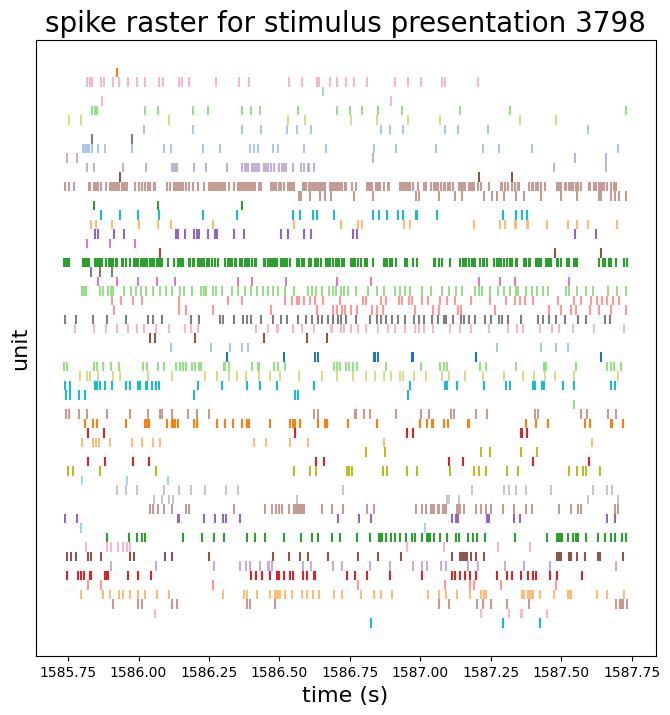

stimulus_block                                        2.0
start_time                                    1585.734418
stop_time                                     1587.736098
contrast                                              0.8
orientation                                         180.0
size                                       [250.0, 250.0]
frame                                                null
stimulus_name                           drifting_gratings
y_position                                           null
x_position                                           null
temporal_frequency                                    2.0
color                                                null
spatial_frequency                                    0.04
phase                    [42471.86666667, 42471.86666667]
duration                                          2.00168
stimulus_condition_id                                 246
Name: 3798, dtype: object

In [60]:
first_drifting_grating_presentation_id = times['stimulus_presentation_id'].values[0]
plot_times = times[times['stimulus_presentation_id'] == first_drifting_grating_presentation_id]

fig = raster_plot(plot_times, title=f'spike raster for stimulus presentation {first_drifting_grating_presentation_id}')
plt.show()

# also print out this presentation
session.stimulus_presentations.loc[first_drifting_grating_presentation_id]

In [61]:
stats = session.conditionwise_spike_statistics(
    stimulus_presentation_ids=drifting_gratings_presentation_ids,
    unit_ids=high_snr_unit_ids
)

# display the parameters associated with each condition
stats = pd.merge(stats, session.stimulus_conditions, left_on="stimulus_condition_id", right_index=True)

stats.head()

,,spike_count,stimulus_presentation_count,spike_mean,spike_std,spike_sem,units,contrast,orientation,size,frame,stimulus_name,y_position,x_position,temporal_frequency,color,opacity,mask,spatial_frequency,phase,color_triplet
unit_id,stimulus_condition_id,,,,,,,,,,,,,,,,,,,,
951799336,246,13,15,0.866667,1.995232,0.515167,deg,0.8,180.0,"[250.0, 250.0]",null,drifting_gratings,null,null,2.0,null,True,None,0.04,"[42471.86666667, 42471.86666667]","[1.0, 1.0, 1.0]"
951800977,246,26,15,1.733333,2.737743,0.706882,deg,0.8,180.0,"[250.0, 250.0]",null,drifting_gratings,null,null,2.0,null,True,None,0.04,"[42471.86666667, 42471.86666667]","[1.0, 1.0, 1.0]"
951801127,246,103,15,6.866667,7.414914,1.914523,deg,0.8,180.0,"[250.0, 250.0]",null,drifting_gratings,null,null,2.0,null,True,None,0.04,"[42471.86666667, 42471.86666667]","[1.0, 1.0, 1.0]"
951801187,246,4,15,0.266667,0.593617,0.153271,deg,0.8,180.0,"[250.0, 250.0]",null,drifting_gratings,null,null,2.0,null,True,None,0.04,"[42471.86666667, 42471.86666667]","[1.0, 1.0, 1.0]"
951801462,246,83,15,5.533333,2.587516,0.668094,deg,0.8,180.0,"[250.0, 250.0]",null,drifting_gratings,null,null,2.0,null,True,None,0.04,"[42471.86666667, 42471.86666667]","[1.0, 1.0, 1.0]"


In [62]:
# We're going to build an array of spike counts surrounding stimulus presentation onset
# To do that, we will need to specify some bins (in seconds, relative to stimulus onset)
time_bin_edges = np.linspace(-0.01, 0.4, 200)

# look at responses to the flash stimulus
flash_250_ms_stimulus_presentation_ids = session.stimulus_presentations[
    session.stimulus_presentations['stimulus_name'] == 'flashes'
].index.values

# and get a set of units with only decent snr
decent_snr_unit_ids = session.units[
    session.units['snr'] >= 1.5
].index.values

spike_counts_da = session.presentationwise_spike_counts(
    bin_edges=time_bin_edges,
    stimulus_presentation_ids=flash_250_ms_stimulus_presentation_ids,
    unit_ids=decent_snr_unit_ids
)
spike_counts_da

<xarray.DataArray 'spike_counts' (stimulus_presentation_id: 150,
                                  time_relative_to_stimulus_onset: 199,
                                  unit_id: 631)>
array([[[0, 1, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 1, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
...
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [1, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]]], dtype=uint16)
Coordinates:
  * stimulus_presentation_id         (stimulus_presentation_id) int64 3647 .....
  * time_relative_to_stimulus_onset  (time_relative_to_stimulus_onset) float64 ...
  * unit_id                          (unit_id) int64 951814884 ... 951814312

In [63]:
## get numpy array back
spike_counts_np = spike_counts_ds.values

NameError: name 'spike_counts_ds' is not defined

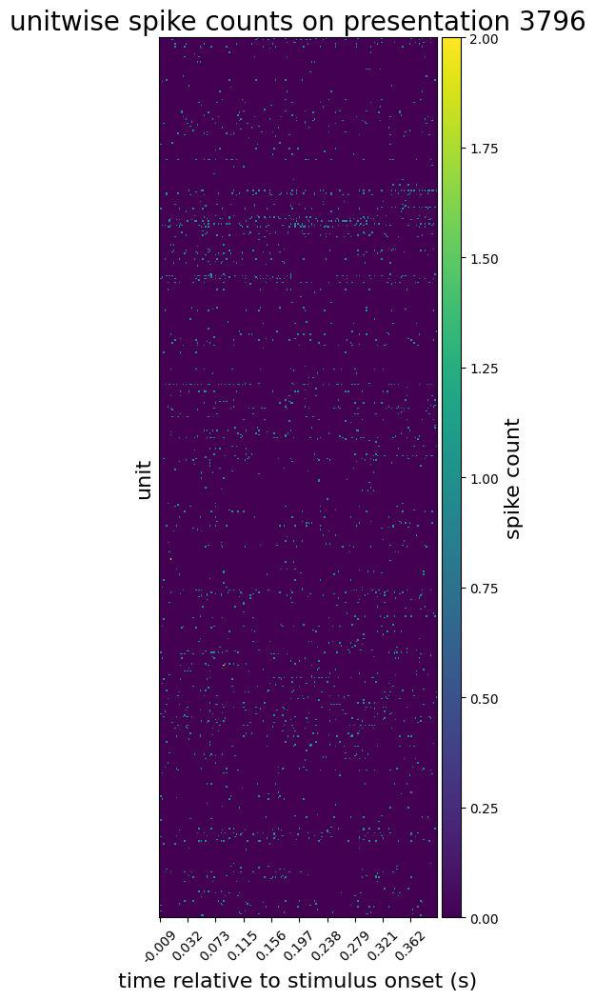

In [64]:
presentation_id = 3796 # chosen arbitrarily
plot_spike_counts(
    spike_counts_da.loc[{'stimulus_presentation_id': presentation_id}], 
    spike_counts_da['time_relative_to_stimulus_onset'],
    'spike count', 
    f'unitwise spike counts on presentation {presentation_id}'
)

plt.show()

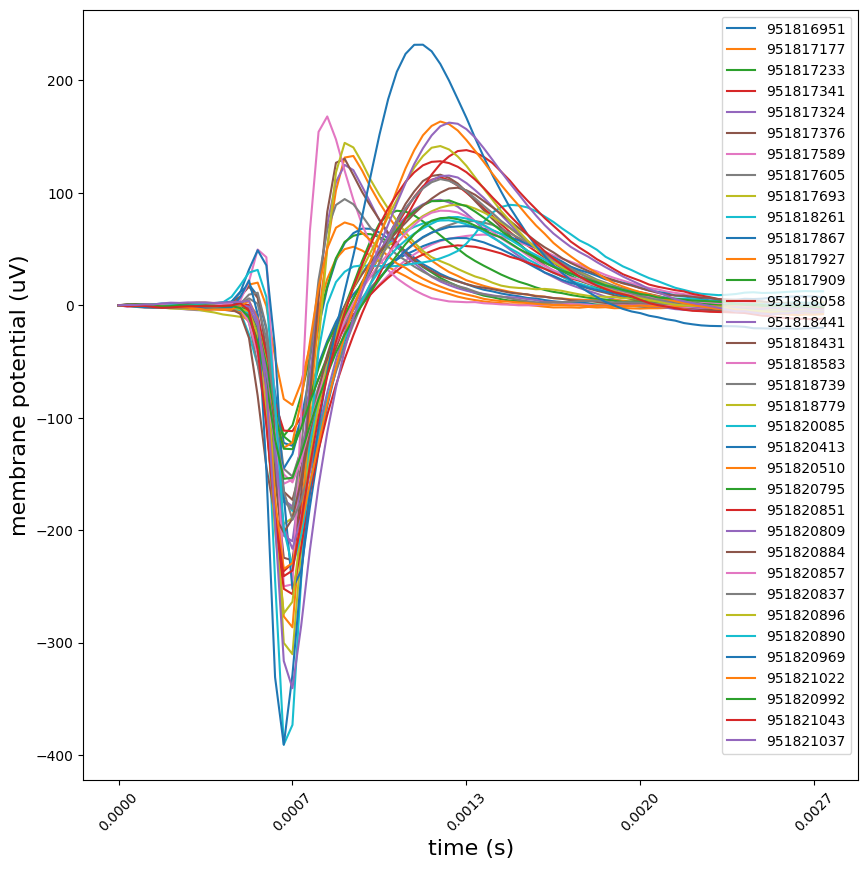

In [65]:
units_of_interest = high_snr_unit_ids[:35]

waveforms = {uid: session.mean_waveforms[uid] for uid in units_of_interest}
peak_channels = {uid: session.units.loc[uid, 'peak_channel_id'] for uid in units_of_interest}

# plot the mean waveform on each unit's peak channel/
plot_mean_waveforms(waveforms, units_of_interest, peak_channels)
plt.show()

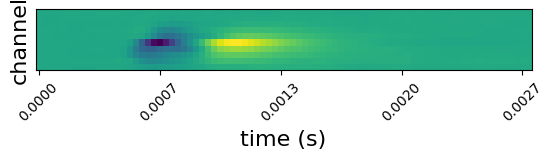

In [66]:
uid = units_of_interest[12]
unit_waveforms = waveforms[uid]
peak_channel = peak_channels[uid]
peak_channel_idx = np.where(unit_waveforms["channel_id"] == peak_channel)[0][0]

ch_min = max(peak_channel_idx - 10, 0)
ch_max = min(peak_channel_idx + 10, len(unit_waveforms["channel_id"]) - 1)
surrounding_channels = unit_waveforms["channel_id"][np.arange(ch_min, ch_max, 2)]

fig, ax = plt.subplots()
ax.imshow(unit_waveforms.loc[{"channel_id": surrounding_channels}])

ax.yaxis.set_major_locator(plt.NullLocator())
ax.set_ylabel("channel", fontsize=16)

ax.set_xticks(np.arange(0, len(unit_waveforms['time']), 20))
ax.set_xticklabels([f'{float(ii):1.4f}' for ii in unit_waveforms['time'][::20]], rotation=45)
ax.set_xlabel("time (s)", fontsize=16)

plt.show()

In [68]:
mean_spike_counts = spike_counts_da.mean(dim='stimulus_presentation_id')
mean_spike_counts

<xarray.DataArray 'spike_counts' (time_relative_to_stimulus_onset: 199,
                                  unit_id: 631)>
array([[0.02666667, 0.1       , 0.08      , ..., 0.00666667, 0.        ,
        0.00666667],
       [0.02666667, 0.06666667, 0.04666667, ..., 0.02      , 0.        ,
        0.        ],
       [0.02      , 0.11333333, 0.03333333, ..., 0.03333333, 0.        ,
        0.        ],
       ...,
       [0.02666667, 0.09333333, 0.05333333, ..., 0.00666667, 0.        ,
        0.        ],
       [0.02666667, 0.06666667, 0.02666667, ..., 0.00666667, 0.02      ,
        0.        ],
       [0.02666667, 0.12      , 0.02      , ..., 0.        , 0.        ,
        0.        ]])
Coordinates:
  * time_relative_to_stimulus_onset  (time_relative_to_stimulus_onset) float64 ...
  * unit_id                          (unit_id) int64 951814884 ... 951814312

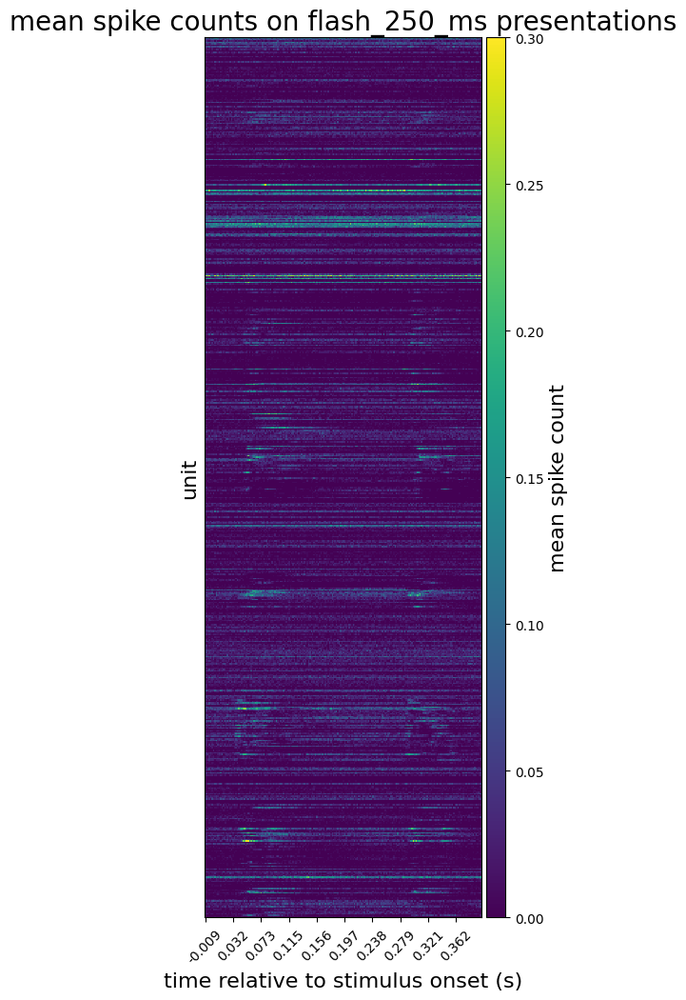

In [69]:
plot_spike_counts(
    mean_spike_counts, 
    mean_spike_counts['time_relative_to_stimulus_onset'],
    'mean spike count', 
    'mean spike counts on flash_250_ms presentations'
)
plt.show()

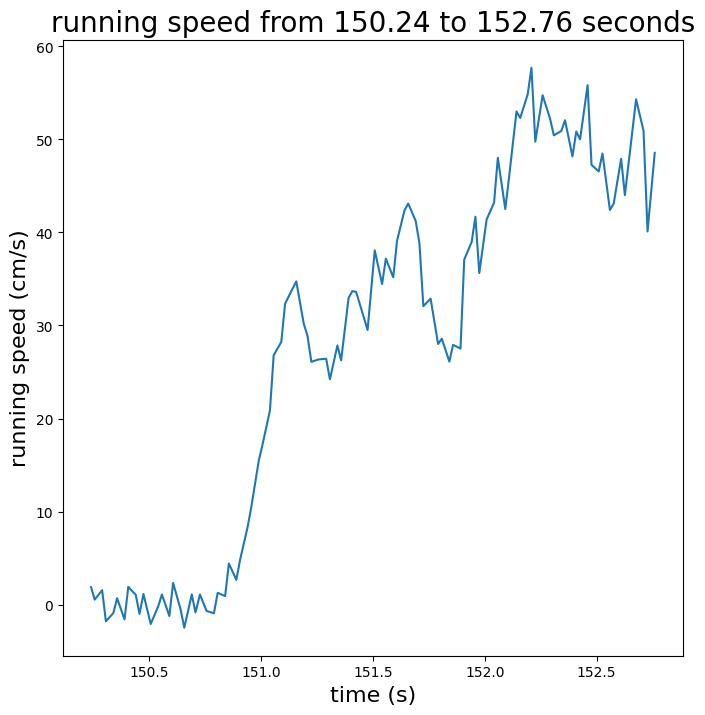

In [72]:
running_speed_midpoints = session.running_speed["start_time"] + \
    (session.running_speed["end_time"] - session.running_speed["start_time"]) / 2
plot_running_speed(
    running_speed_midpoints, 
    session.running_speed["velocity"], 
    start_index=5000,
    stop_index=5100
)
plt.show()

In [73]:
pupil_data = session.get_pupil_data()
pupil_data

,corneal_reflection_center_x,corneal_reflection_center_y,corneal_reflection_height,corneal_reflection_width,corneal_reflection_phi,pupil_center_x,pupil_center_y,pupil_height,pupil_width,pupil_phi,eye_center_x,eye_center_y,eye_height,eye_width,eye_phi
Time (s),,,,,,,,,,,,,,,
3.20620,321.221602,215.484021,11.091658,12.801322,-0.340513,291.258341,187.965473,96.294414,102.751684,-0.759200,310.242901,207.161069,273.535714,323.227726,0.099357
3.22948,321.291022,215.282122,11.318211,12.807982,-0.243113,290.703953,188.659872,94.239278,103.384550,-0.715791,310.140402,207.007975,273.303505,322.919143,0.091675
3.23714,321.294868,215.055000,11.136122,12.423237,-0.331511,290.687532,188.294754,94.729755,103.814759,-0.673967,310.224041,206.700513,273.481027,323.497356,0.090202
3.27028,321.288914,215.250999,10.596050,12.414694,-0.245863,289.154532,188.524943,93.877264,99.315115,-0.732209,310.134502,206.791105,273.988038,323.147754,0.091154
3.30396,320.819438,215.915143,9.366927,12.870596,0.109020,290.206682,187.411271,90.221821,103.856061,-0.583017,310.226498,206.519467,273.542559,322.233983,0.097546
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9939.71240,322.580849,216.600349,12.799143,13.400555,-0.525985,NaN,NaN,NaN,NaN,NaN,313.501794,210.587410,280.224381,322.533004,0.167348
9939.74576,324.007748,216.520870,11.843170,13.212379,-0.403054,NaN,NaN,NaN,NaN,NaN,313.532165,211.023852,280.388767,322.942096,0.189335
9939.77918,324.118835,216.898871,11.336945,12.877454,-0.254458,NaN,NaN,NaN,NaN,NaN,314.227284,210.967838,279.978946,323.751767,0.201428


In [74]:
%%capture
from matplotlib import animation
from matplotlib.patches import Ellipse

def plot_animated_ellipse_fits(pupil_data: pd.DataFrame, start_frame: int, end_frame: int):

    start_frame = 0 if (start_frame < 0) else start_frame
    end_frame = len(pupil_data) if (end_frame > len(pupil_data)) else end_frame
    
    frame_times = pupil_data.index.values[start_frame:end_frame]
    interval = np.average(np.diff(frame_times)) * 1000

    fig = plt.figure()
    ax = plt.axes(xlim=(0, 480), ylim=(0, 480))

    cr_ellipse = Ellipse((0, 0), width=0.0, height=0.0, angle=0, color='white')
    pupil_ellipse = Ellipse((0, 0), width=0.0, height=0.0, angle=0, color='black')
    eye_ellipse = Ellipse((0, 0), width=0.0, height=0.0, angle=0, color='grey')

    ax.add_patch(eye_ellipse)
    ax.add_patch(pupil_ellipse)
    ax.add_patch(cr_ellipse)

    def update_ellipse(ellipse_patch, ellipse_frame_vals: pd.DataFrame, prefix: str):
        ellipse_patch.center = tuple(ellipse_frame_vals[[f"{prefix}_center_x", f"{prefix}_center_y"]].values)
        ellipse_patch.width = ellipse_frame_vals[f"{prefix}_width"]
        ellipse_patch.height = ellipse_frame_vals[f"{prefix}_height"]
        ellipse_patch.angle = np.degrees(ellipse_frame_vals[f"{prefix}_phi"])
    
    def init():
        return [cr_ellipse, pupil_ellipse, eye_ellipse]

    def animate(i):
        ellipse_frame_vals = pupil_data.iloc[i]
        
        update_ellipse(cr_ellipse, ellipse_frame_vals, prefix="corneal_reflection")
        update_ellipse(pupil_ellipse, ellipse_frame_vals, prefix="pupil")
        update_ellipse(eye_ellipse, ellipse_frame_vals, prefix="eye")
        
        return [cr_ellipse, pupil_ellipse, eye_ellipse]
    
    return animation.FuncAnimation(fig, animate, init_func=init, interval=interval, frames=range(start_frame, end_frame), blit=True)

anim = plot_animated_ellipse_fits(pupil_data, 100, 600)

In [75]:
from IPython.display import HTML

HTML(anim.to_jshtml())

In [76]:
gaze_data = session.get_screen_gaze_data()
gaze_data

,raw_eye_area,raw_pupil_area,raw_screen_coordinates_x_cm,raw_screen_coordinates_y_cm,raw_screen_coordinates_spherical_x_deg,raw_screen_coordinates_spherical_y_deg
Time (s),,,,,,
3.20620,0.072246,0.008627,3.192181,0.863288,11.996034,3.294251
3.22948,0.072116,0.008734,3.103325,0.916339,11.669031,3.496204
3.23714,0.072292,0.008807,3.116553,0.919020,11.717276,3.506406
3.27028,0.072347,0.008060,3.107700,1.061316,11.677819,4.047634
3.30396,0.072026,0.008814,3.285226,0.929605,12.331983,3.546691
...,...,...,...,...,...,...
9939.71240,NaN,NaN,NaN,NaN,NaN,NaN
9939.74576,NaN,NaN,NaN,NaN,NaN,NaN
9939.77918,NaN,NaN,NaN,NaN,NaN,NaN


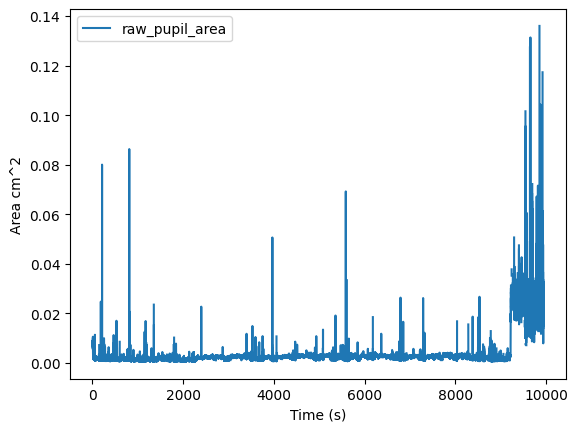

In [77]:
ax = gaze_data[["raw_pupil_area"]].plot()
_ = ax.set_ylabel("Area cm^2")

In [ ]:
data = gaze_data[["raw_pupil_area"]]

Local field potential

In [78]:
# list the probes recorded from in this session
session.probes.head()

,description,location,sampling_rate,lfp_sampling_rate,has_lfp_data
id,,,,,
760640083,probeA,See electrode locations,29999.949611,1249.997900,True
760640087,probeB,See electrode locations,29999.902541,1249.995939,True
760640090,probeC,See electrode locations,29999.905275,1249.996053,True
760640094,probeD,See electrode locations,29999.905275,1249.996053,True
760640097,probeE,See electrode locations,29999.985335,1249.999389,True


In [86]:
probe_id = session.probes.index.values[0]
lfp = session.get_lfp(probe_id)

KeyboardInterrupt: 

In [87]:
# now use a utility to associate intervals of /rows with structures
structure_acronyms, intervals = session.channel_structure_intervals(lfp["channel"])
interval_midpoints = [aa + (bb - aa) / 2 for aa, bb in zip(intervals[:-1], intervals[1:])]

print(structure_acronyms)
print(intervals)

['APN' 'DG' 'CA1' 'VISam' nan]
[ 0 27 35 51 74 87]


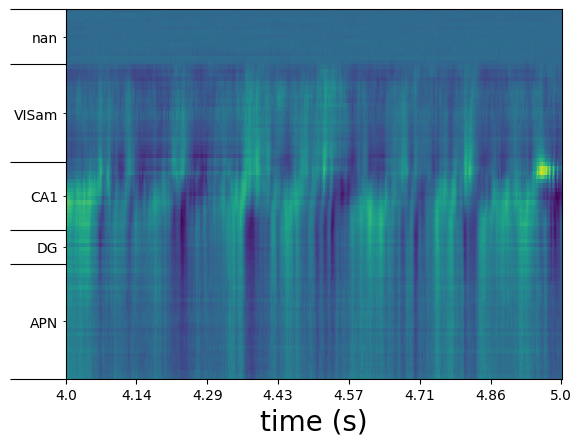

In [88]:
window = np.where(np.logical_and(lfp["time"] < 5.0, lfp["time"] >= 4.0))[0]

fig, ax = plt.subplots()
ax.pcolormesh(lfp[{"time": window}].T)

ax.set_yticks(intervals)
ax.set_yticks(interval_midpoints, minor=True)
ax.set_yticklabels(structure_acronyms, minor=True)
plt.tick_params("y", which="major", labelleft=False, length=40)

num_time_labels = 8
time_label_indices = np.around(np.linspace(1, len(window), num_time_labels)).astype(int) - 1
time_labels = [ f"{val:1.3}" for val in lfp["time"].values[window][time_label_indices]]
ax.set_xticks(time_label_indices + 0.5)
ax.set_xticklabels(time_labels)
ax.set_xlabel("time (s)", fontsize=20)

plt.show()